<a href="https://colab.research.google.com/github/krzs13/ASCII2Pix/blob/master/ASCII2Pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 01. Dependencies

In [ ]:
import datetime
import os
import time

from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from IPython import display
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm

# 02. Input Pipeline


In [ ]:
train_inputs = np.load('/content/drive/My Drive/Projects/ASCII2Pix/data/ascii_256x256.npy')
train_labels = np.load('/content/drive/My Drive/Projects/ASCII2Pix/data/images_256x256.npy')
train_inputs = np.expand_dims(train_inputs, axis=-1)
train_labels = np.expand_dims(train_labels, axis=-1)

train_inputs, val_inputs, train_labels, val_labels = train_test_split(
    train_inputs, train_labels, test_size=0.02, random_state=42)

In [ ]:
datagen_args = dict(
    rotation_range=10,
    zoom_range=[1.0, 1.0],
    horizontal_flip=True,
)

inputs_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**datagen_args)
labels_datagen = tf.keras.preprocessing.image.ImageDataGenerator(**datagen_args)

DATAGEN_SEED = 1
BATCH_SIZE = 1

inputs_datagen.fit(train_inputs, augment=True, seed=DATAGEN_SEED)
labels_datagen.fit(train_labels, augment=True, seed=DATAGEN_SEED)

inputs_generator = inputs_datagen.flow(
    train_inputs, batch_size=1, seed=DATAGEN_SEED)
labels_generator = inputs_datagen.flow(
    train_labels, batch_size=1, seed=DATAGEN_SEED)

train_generator = zip(inputs_generator, labels_generator)

train_dataset = tf.data.Dataset.from_generator(
    lambda: train_generator, output_types=(tf.float32, tf.float32))
val_dataset = tf.data.Dataset.from_tensor_slices((val_inputs, val_labels))
val_dataset = val_dataset.batch(1)

# 03. Generator

## Generator Layers

### Downsample Layer

In [ ]:
class DownsampleLayer(tf.keras.layers.Layer):
    """Downsampling layer for the encoder part of the generator model.

    Args:
        filers: Filters of the convolution layer.
        kernel_size: Kernel size of the convolution layer.
        strides: Strides of the convolution layer.
        gaussian_noise_stddev: Standard deviation of the noise distribution.
    """

    def __init__(
        self, 
        filters: int, 
        kernel_size: int, 
        strides: Tuple[int, int], 
        gaussian_noise_stddev: float,
    ):
        super().__init__()
        self._conv = tf.keras.layers.Conv2D(
            filters,
            kernel_size,
            strides=strides,
            padding='same',
        )
        self._gaussian_noise = tf.keras.layers.GaussianNoise(
            gaussian_noise_stddev)
        self._activation = tf.keras.layers.ReLU()

    def call(self, inputs):
        x = self._conv(inputs)
        x = self._gaussian_noise(x)
        x = self._activation(x)

        return x

### Upsample Layer

In [ ]:
class UpsampleLayer(tf.keras.layers.Layer):
    """Upsampling layer for the decoder part of the generator model.

    Args:
        filers: Filters of the transposed convolution layer.
        kernel_size: Kernel size of the transposed convolution layer.
        strides: Strides of the transposed convolution layer.
        gaussian_noise_stddev: Standard deviation of the noise distribution.
    """

    def __init__(
        self, 
        filters: int, 
        kernel_size: int, 
        strides: Tuple[int, int], 
        gaussian_noise_stddev: float,
    ):
        super().__init__()
        self._transpose_conv = tf.keras.layers.Conv2DTranspose(
            filters,
            kernel_size,
            strides=strides,
            padding='same',
        )
        self._gaussian_noise = tf.keras.layers.GaussianNoise(
            gaussian_noise_stddev)
        self._activation = tf.keras.layers.ReLU()

    def call(self, inputs):
        x = self._transpose_conv(inputs)
        x = self._gaussian_noise(x)
        x = self._activation(x)

        return x

## Generator Model

In [ ]:
class Generator(tf.keras.Model):
    """Generator model.
        
    Args:
        gaussian_noise_stddev: Standard deviation of the noise distribution.
    """

    def __init__(
        self, 
        gaussian_noise_stddev: float, 
    ):
        super().__init__()
        self._downsample_1 = DownsampleLayer(
            filters=32,
            kernel_size=32,
            strides=(16, 16),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._downsample_2 = DownsampleLayer(
            filters=64,
            kernel_size=16,
            strides=(8, 8),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._downsample_3 = DownsampleLayer(
            filters=128,
            kernel_size=8,
            strides=(4, 4),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._downsample_4 = DownsampleLayer(
            filters=256,
            kernel_size=4,
            strides=(2, 2),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._upsample_1 = UpsampleLayer(
            filters=64,
            kernel_size=4,
            strides=(2, 2),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._concatenate_1 = tf.keras.layers.Concatenate()
        self._upsample_2 = UpsampleLayer(
            filters=128,
            kernel_size=4,
            strides=(2, 2),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._concatenate_2 = tf.keras.layers.Concatenate()
        self._upsample_3 = UpsampleLayer(
            filters=256,
            kernel_size=4,
            strides=(2, 2),
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._concatenate_3 = tf.keras.layers.Concatenate()
        self._outputs = tf.keras.layers.Conv2DTranspose(
            1,
            4,
            strides=(2, 2),
            padding='same',
            activation='tanh'
        )

    def call(self, inputs):
        encoder_1 = self._downsample_1(inputs)
        encoder_2 = self._downsample_2(inputs)
        encoder_3 = self._downsample_3(inputs)
        encoder_4 = self._downsample_4(inputs)

        decoder = self._upsample_1(encoder_1)
        decoder = self._concatenate_1([decoder, encoder_2])
        decoder = self._upsample_2(decoder)
        decoder = self._concatenate_2([decoder, encoder_3])
        decoder = self._upsample_3(decoder)
        decoder = self._concatenate_3([decoder, encoder_4])

        outputs = self._outputs(decoder)

        return outputs

### Generator Loss

In [ ]:
LAMBDA = 100

def generator_loss(discriminator_output, generator_output, target):
    """Calculates loss of generator model.

    Args:
        discriminator_output: Output of the discriminator model.
        generator_output: Output of the generator model.
        target: Ground truth image.

    Returns:
        generator_total_loss: Total loss of the generator model.
        gan_loss: Discriminator loss calculated on generated images.
        l1_loss: Root mean squared error between generator output and target.
    """

    loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    gan_loss = loss_object(
        tf.ones_like(discriminator_output), discriminator_output)
    l1_loss = tf.math.sqrt(tf.reduce_mean(tf.math.squared_difference(
        generator_output, target)))
    
    generator_total_loss = gan_loss + (LAMBDA * l1_loss)

    return generator_total_loss, gan_loss, l1_loss

# 04. Discriminator

## Discriminator Layers

### Downsample Layer

In [ ]:
class DiscriminatorDownsampleLayer(tf.keras.layers.Layer):
    """Downsampling layer for the discriminator model.
    
    Args:
        filers: Filters of the convolution layer.
        kernel_size: Kernel size of the convolution layer.
        gaussian_noise_stddev: Standard deviation of the noise distribution.
    """

    def __init__(
        self, 
        filters: int, 
        kernel_size: int, 
        gaussian_noise_stddev: float,
    ):
        super().__init__()
        self._conv = tf.keras.layers.Conv2D(
            filters,
            kernel_size,
            strides=(2, 2),
            padding='same',
            use_bias=False,
        )
        self._gaussian_noise = tf.keras.layers.GaussianNoise(
            gaussian_noise_stddev)
        self._activation = tf.keras.layers.LeakyReLU()
        self._batchnorm = tf.keras.layers.BatchNormalization()

    def call(self, inputs):
        x = self._conv(inputs)
        x = self._gaussian_noise(x)
        x = self._activation(x)
        x = self._batchnorm(x)

        return x

### Convolution Layer

In [ ]:
class ConvolutionLayer(tf.keras.layers.Layer):
    """Convolution layer for the discriminator model with 1x1 strides.

    Args:
        filers: Filters of the convolution layer.
        kernel_size: Kernel size of the convolution layer.
        gaussian_noise_stddev: Standard deviation of the noise distribution.
    """

    def __init__(
        self,
        filters: int,
        kernel_size: int,
        gaussian_noise_stddev: float,
    ):
        super().__init__()
        self._conv = tf.keras.layers.Conv2D(
            filters,
            kernel_size,
            strides=(1, 1),
            use_bias=False,
        )
        self._gaussian_noise = tf.keras.layers.GaussianNoise(
            gaussian_noise_stddev)
        self._activation = tf.keras.layers.LeakyReLU()
        self._batchnorm = tf.keras.layers.BatchNormalization()

    def call(self, inputs):
        x = self._conv(inputs)
        x = self._gaussian_noise(x)
        x = self._activation(x)
        x = self._batchnorm(x)

        return x

## Discriminator Model

In [ ]:
class Discriminator(tf.keras.Model):
    """Discriminator model.

    Args:
        gaussian_noise_stddev: Encoder's noise distribution standard deviation.
    """

    def __init__(self, gaussian_noise_stddev: float):
        super().__init__()
        self._concatenate = tf.keras.layers.Concatenate()
        self._downsample_1 = DiscriminatorDownsampleLayer(
            filters=8,
            kernel_size=4,
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._downsample_2 = DiscriminatorDownsampleLayer(
            filters=16,
            kernel_size=4,
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._downsample_3 = DiscriminatorDownsampleLayer(
            filters=16,
            kernel_size=4,
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._zero_padding_1 = tf.keras.layers.ZeroPadding2D()
        self._conv = ConvolutionLayer(
            filters=64,
            kernel_size=4,
            gaussian_noise_stddev=gaussian_noise_stddev,
        )
        self._zero_padding_2 = tf.keras.layers.ZeroPadding2D()
        self._outputs = tf.keras.layers.Conv2D(
            1,
            4,
            strides=(1, 1),
        )

    def call(self, inputs):
        inputs, target = inputs

        encoder = self._concatenate([inputs, target])
        encoder = self._downsample_1(encoder)
        encoder = self._downsample_2(encoder)
        encoder = self._downsample_3(encoder)
        encoder = self._zero_padding_1(encoder)
        encoder = self._conv(encoder)
        encoder = self._zero_padding_2(encoder)
        outputs = self._outputs(encoder)

        return outputs

### Discriminator Loss

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
    """Calculates loss of discriminator model.

    Args:
        disc_real_output: Output of the discriminator model that has ASCII image
            and target as inputs.
        disc_generated_output: Output of the discriminator model that has ASCII 
            image and generated image as inputs.

    Returns:
        total_discriminator_loss: Total loss of discriminator model.
    """

    loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    real_loss = loss_object(
        tf.ones_like(disc_real_output),
        disc_real_output,
    )
    generated_loss = loss_object(
        tf.zeros_like(disc_generated_output),
        disc_generated_output,
    )
    
    total_discriminator_loss = real_loss + generated_loss

    return total_discriminator_loss

# 05. Optimizers

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# 06. Generate Images

In [ ]:
def generate_images_from_predictions(model, inputs, target):
    """Generates images from the predictions and plot them.

    Args:
        model: Model used for the predictons.
        inputs: Input of model.
        target: Ground truth image.
    """

    prediction = model(inputs, training=False)

    display_list = [
        tf.squeeze(inputs),
        tf.squeeze(prediction),
        tf.squeeze(target),
    ]
    title = ['Input Image', 'Predicted Image', 'Ground Truth']
    plt.figure(figsize=(15, 15))

    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.title(title[i])
        plt.imshow(display_list[i], cmap='gray')
        plt.axis('off')

    plt.show()

# 07. Training

## Custom Train Step

In [ ]:
class TrainASCII2Pix:
    """Custom training of the ASCII2Pix network.
    
    Args:
        generator_model: The generator model of the ASCII2Pix network.
        generator_loss: Loss of the generator model.
        generator_optimizer: Optimizer for the generator model.
        discriminator_model: The discriminator model of the ASCII2Pix network.
        discriminator_loss: Loss of the discriminator model.
        discriminator_optimizer: Optimizer for the discriminator model.
        image_generator: Function that generates and plots images from tensors.
        log_directory: Directory of the log files.
    """

    def __init__(
        self,
        generator_model,
        generator_loss,
        generator_optimizer,
        discriminator_model,
        discriminator_loss,
        discriminator_optimizer,
        image_generator,
        log_directory: str,
    ):
        self._generator = generator_model
        self._generator_loss = generator_loss
        self._generator_optimizer = generator_optimizer
        self._discriminator = discriminator_model
        self._discriminator_loss = discriminator_loss
        self._discriminator_optimizer = discriminator_optimizer
        self._image_generator = image_generator
        self._summary_writer = tf.summary.create_file_writer(
            f'{log_directory}fit/{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}')

    @tf.function
    def _train_step(self, inputs, target, epoch):
        """Trains generator and discriminator for 1 step.
        
        Args:
            inputs: ASCII image.
            target: Ground truth image.
            epoch: Current epoch of the training.
        """

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            gen_output = self._generator(inputs, training=True)

            disc_real_output = self._discriminator(
                [inputs, target], training=True)
            disc_generated_output = self._discriminator(
                [inputs, gen_output], training=True)
            
            gen_total_loss, gen_gan_loss, gen_l1_loss = self._generator_loss(
                disc_generated_output, gen_output, target)
            disc_loss = self._discriminator_loss(
                disc_real_output, disc_generated_output)
            
        gen_gradients = gen_tape.gradient(
            gen_total_loss, self._generator.trainable_variables)
        disc_gradients = disc_tape.gradient(
            disc_loss, self._discriminator.trainable_variables)
        
        generator_optimizer.apply_gradients(zip(
            gen_gradients, self._generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(
            disc_gradients, self._discriminator.trainable_variables))

        with self._summary_writer.as_default():
            tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
            tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
            tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
            tf.summary.scalar('disc_loss', disc_loss, step=epoch)

    def fit(
        self, train_dataset, val_dataset, steps_per_epoch: int, epochs: int):
        """Setup training of model and generate images while training progress.
        
        Args:
            train_dataset: ASCII images and ground truth images for training.
            val_dataset: ASCII images and ground truth images for validation.
            steps_per_epoch: Steps per epoch of the training.
            epochs: Number of epochs for the training.
        """

        train_dataset_size = 1575  # train_dataset.shape[0]

        for epoch in range(1, epochs + 1):
            start = time.time()
            display.clear_output(wait=True)

            for inputs, target in val_dataset.take(3):
                self._image_generator(self._generator, inputs, target)

            print(f'Epoch: {epoch}/{epochs}')
            
            with tqdm(total=steps_per_epoch) as pbar:
                for inputs, target in train_dataset.take(steps_per_epoch):
                    self._train_step(inputs, target, epoch)
                    pbar.update(1)

            print()
            print(f'Time taken for epoch {epoch} is {time.time() - start} sec.\n')

## TensorBoard

In [ ]:
!mkdir -p logs
log_dir = 'logs/'

%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

## ASCII2Pix Training

In [ ]:
generator = Generator(0.01)
discriminator = Discriminator(0.1)

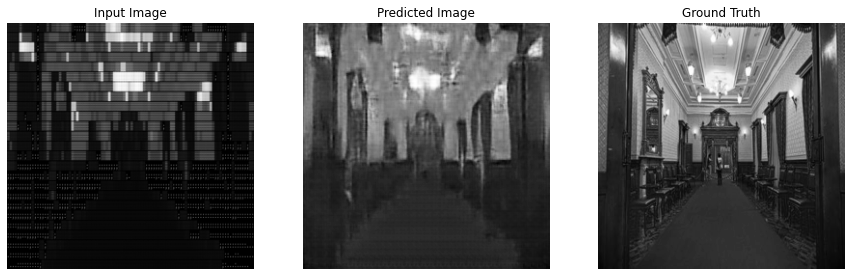

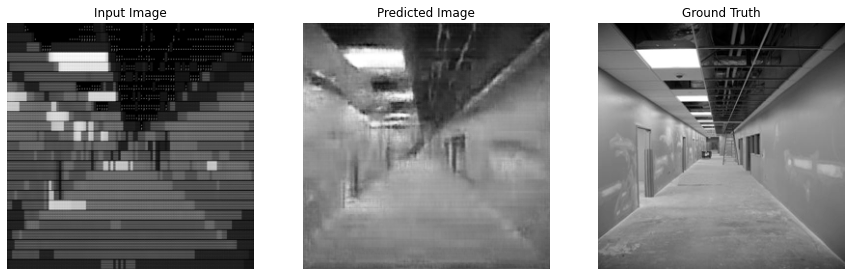

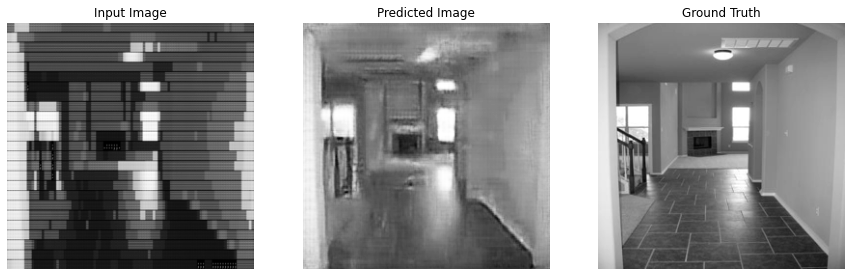

Epoch: 95/95




Time taken for epoch 95 is 30.906904458999634 sec.



In [ ]:
ascii2pix = TrainASCII2Pix(
    generator, 
    generator_loss, 
    generator_optimizer, 
    discriminator, 
    discriminator_loss, 
    discriminator_optimizer, 
    generate_images_from_predictions, 
    log_dir,
    )

ascii2pix.fit(train_dataset, val_dataset, steps_per_epoch=1715, epochs=95)

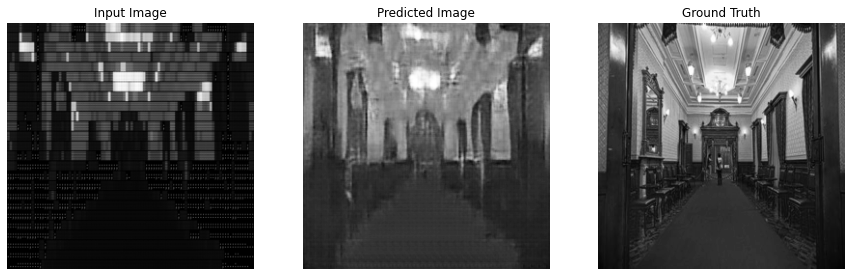

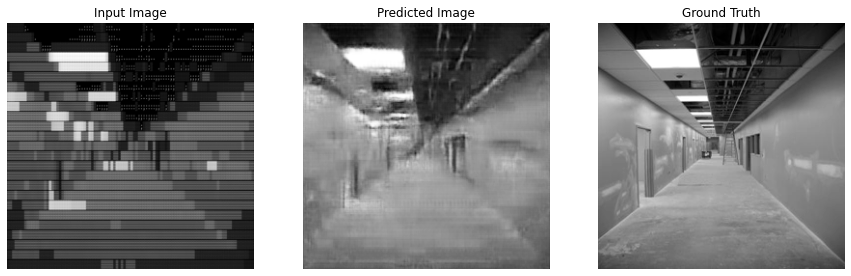

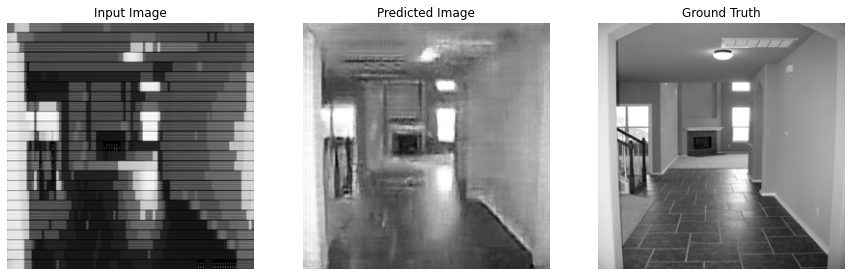

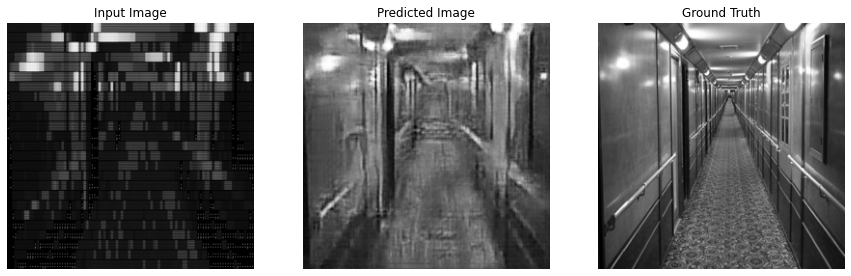

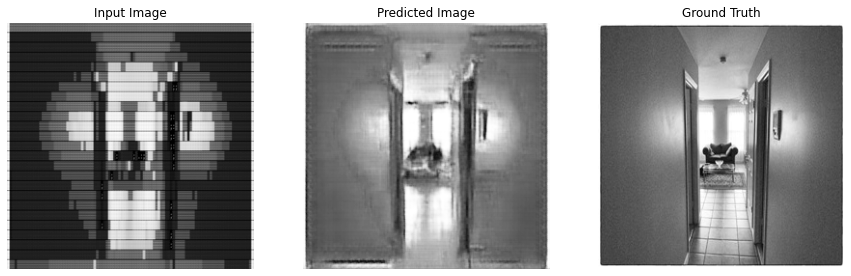

...

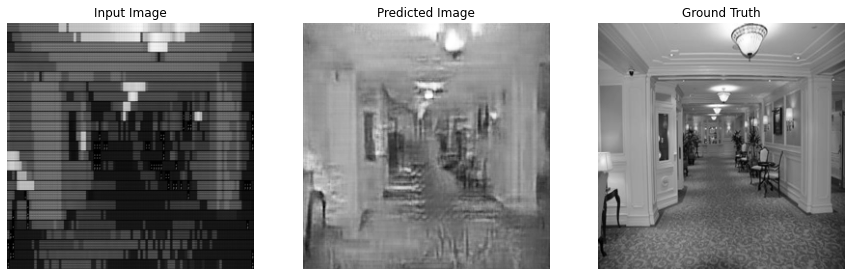

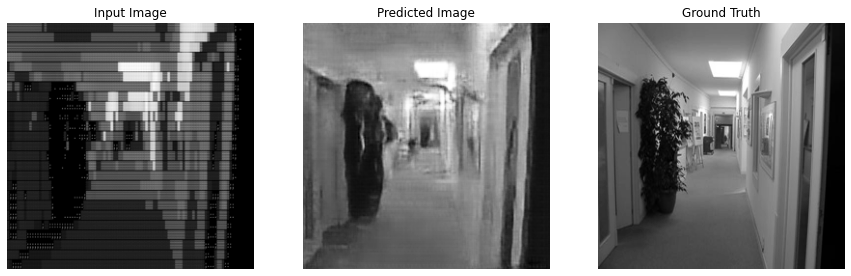

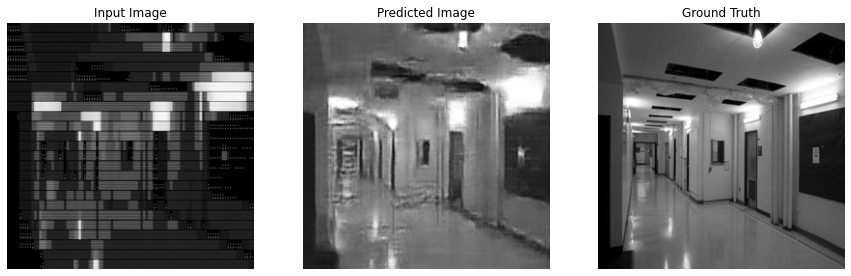

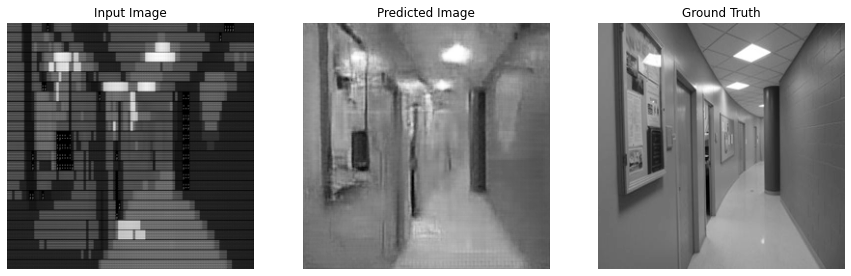

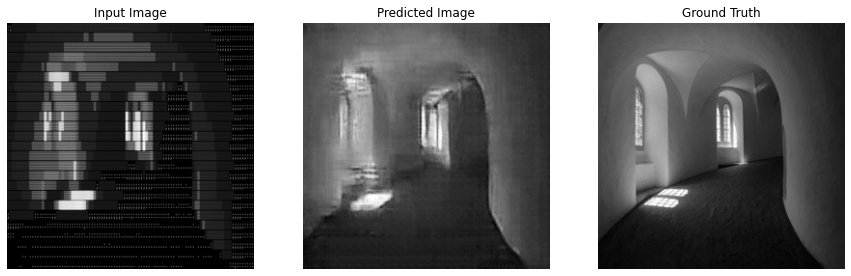

In [ ]:
for inputs, target in val_dataset.take(35):
    generate_images_from_predictions(generator, inputs, target)